In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [23]:
importlib.reload(params) #####
importlib.reload(strategies) #####
df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
n_shares = 1

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day_sim,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            shares      = n_shares,
            invest_frac = 0.1, # percentage of maximum invested cash
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/21 [00:00<?, ?it/s]

Loop finished. Days simulated: 21


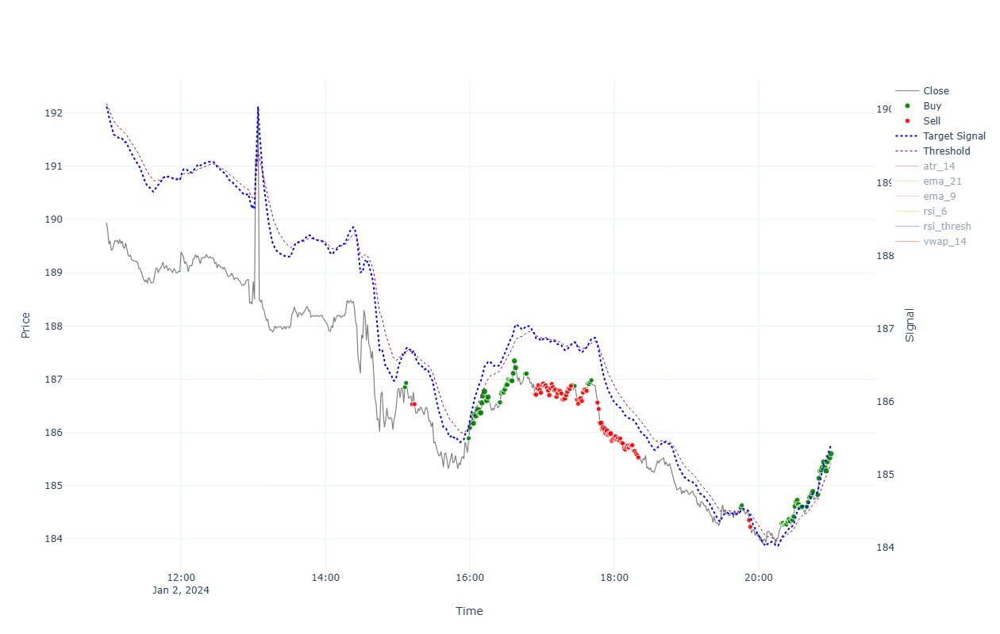


=== Performance for 2024-01-02 00:00:00 ===

INTRADAY:
  shares(612); [buy@187.868, fee=0.004, pos_amnt_buy 114977.398]; [sell@185.563, fee=0.018, pos_amnt_sell 113553.308]; PNL=-1424.09
TRADES:
  Tr[1]: Time(15:06)Ask(186.887)Bid(186.813)Act(Buy)Shrs(1)Pos(1); CashTr(-186.891)=Cost(-186.887)-Fee(-0.004); P&L(114999.921)=CashTot(114813.109)+PosAmt(186.813)
  Tr[2]: Time(15:07)Ask(186.967)Bid(186.892)Act(Buy)Shrs(1)Pos(2); CashTr(-186.971)=Cost(-186.967)-Fee(-0.004); P&L(114999.922)=CashTot(114626.138)+PosAmt(373.784)
  Tr[3]: Time(15:12)Ask(186.567)Bid(186.493)Act(Sell)Shrs(1)Pos(1); CashTr(186.474)=Cost(186.493)-Fee(-0.018); P&L(114999.105)=CashTot(114812.612)+PosAmt(186.493)
  Tr[4]: Time(15:14)Ask(186.567)Bid(186.493)Act(Sell)Shrs(1)Pos(0); CashTr(186.474)=Cost(186.493)-Fee(-0.018); P&L(114999.087)=CashTot(114999.087)+PosAmt(0.0)
  Tr[5]: Time(15:59)Ask(185.927)Bid(185.853)Act(Buy)Shrs(1)Pos(1); CashTr(-185.931)=Cost(-185.927)-Fee(-0.004); P&L(114999.008)=CashTot(114813.156)+PosAmt

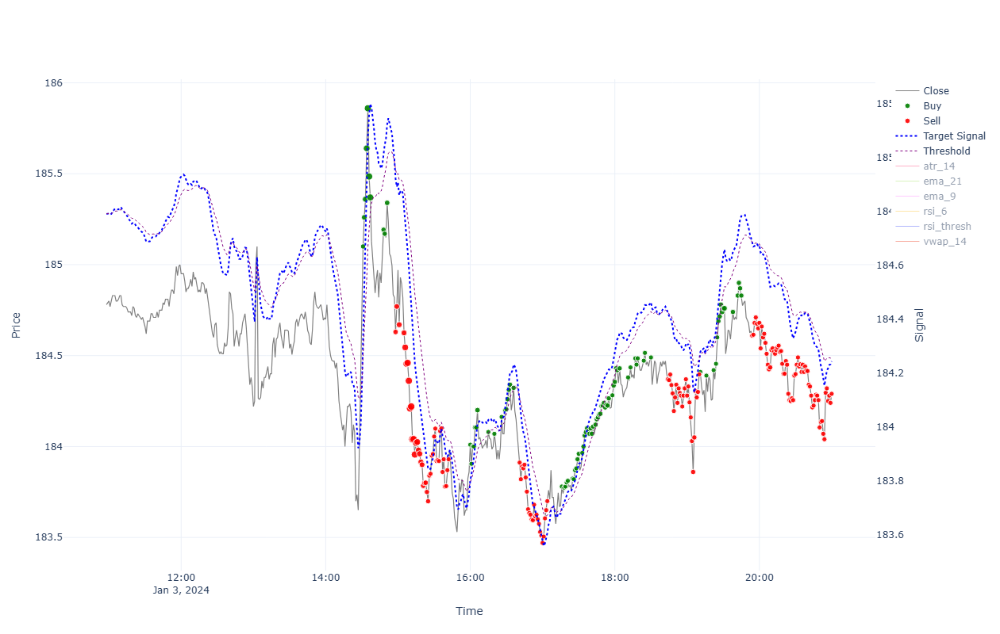


=== Performance for 2024-01-03 00:00:00 ===

INTRADAY:
  shares(614); [buy@184.727, fee=0.004, pos_amnt_buy 113424.796]; [sell@184.253, fee=0.018, pos_amnt_sell 113120.237]; PNL=-304.559
TRADES:
  Tr[1]: Time(14:31)Ask(185.137)Bid(185.063)Act(Buy)Shrs(2)Pos(123); CashTr(-370.282)=Cost(-370.274)-Fee(-0.008); P&L(114929.723)=CashTot(92166.964)+PosAmt(22762.759)
  Tr[2]: Time(14:32)Ask(185.297)Bid(185.223)Act(Buy)Shrs(4)Pos(127); CashTr(-741.204)=Cost(-741.188)-Fee(-0.016); P&L(114949.074)=CashTot(91425.76)+PosAmt(23523.314)
  Tr[3]: Time(14:33)Ask(185.397)Bid(185.323)Act(Buy)Shrs(6)Pos(133); CashTr(-1112.406)=Cost(-1112.382)-Fee(-0.024); P&L(114961.303)=CashTot(90313.353)+PosAmt(24647.949)
  Tr[4]: Time(14:34)Ask(185.677)Bid(185.603)Act(Buy)Shrs(8)Pos(141); CashTr(-1485.448)=Cost(-1485.416)-Fee(-0.032); P&L(114997.896)=CashTot(88827.905)+PosAmt(26169.991)
  Tr[5]: Time(14:35)Ask(185.897)Bid(185.823)Act(Buy)Shrs(10)Pos(151); CashTr(-1859.012)=Cost(-1858.972)-Fee(-0.04); P&L(115028.14)=Ca

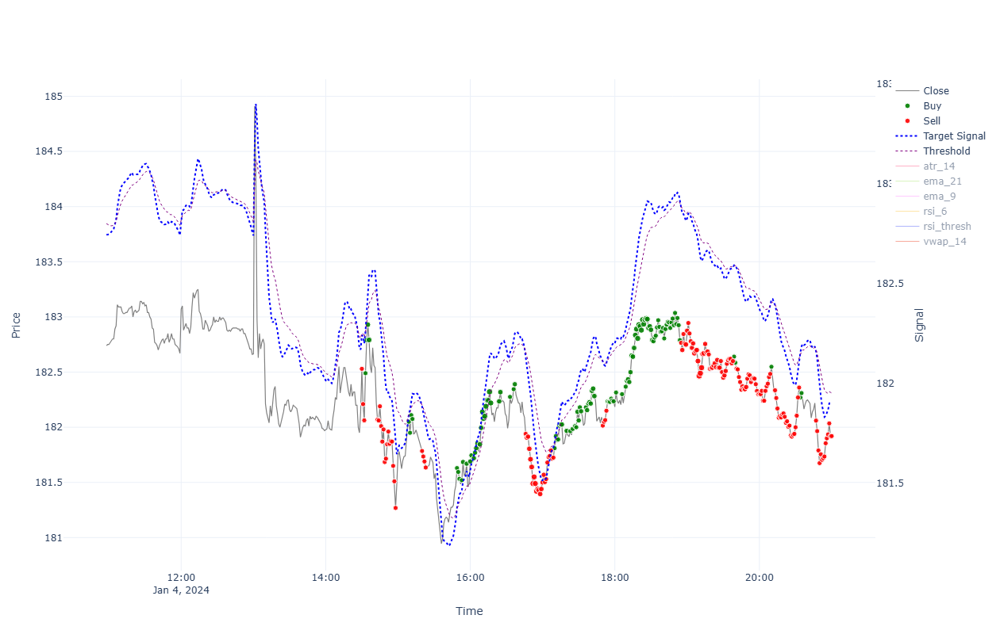


=== Performance for 2024-01-04 00:00:00 ===

INTRADAY:
  shares(619); [buy@182.567, fee=0.004, pos_amnt_buy 113011.143]; [sell@181.884, fee=0.018, pos_amnt_sell 112574.709]; PNL=-436.435
TRADES:
  Tr[1]: Time(14:30)Ask(182.567)Bid(182.493)Act(Sell)Shrs(1)Pos(8); CashTr(182.475)=Cost(182.493)-Fee(-0.018); P&L(114694.508)=CashTot(113234.56)+PosAmt(1459.948)
  Tr[2]: Time(14:31)Ask(182.246)Bid(182.174)Act(Sell)Shrs(1)Pos(7); CashTr(182.155)=Cost(182.174)-Fee(-0.018); P&L(114691.93)=CashTot(113416.715)+PosAmt(1275.215)
  Tr[3]: Time(14:32)Ask(182.099)Bid(182.026)Act(Sell)Shrs(1)Pos(6); CashTr(182.008)=Cost(182.026)-Fee(-0.018); P&L(114690.881)=CashTot(113598.723)+PosAmt(1092.158)
  Tr[4]: Time(14:33)Ask(182.526)Bid(182.454)Act(Buy)Shrs(1)Pos(7); CashTr(-182.53)=Cost(-182.526)-Fee(-0.004); P&L(114693.367)=CashTot(113416.193)+PosAmt(1277.175)
  Tr[5]: Time(14:34)Ask(182.826)Bid(182.753)Act(Buy)Shrs(2)Pos(9); CashTr(-365.661)=Cost(-365.653)-Fee(-0.008); P&L(114695.312)=CashTot(113050.532)+Po

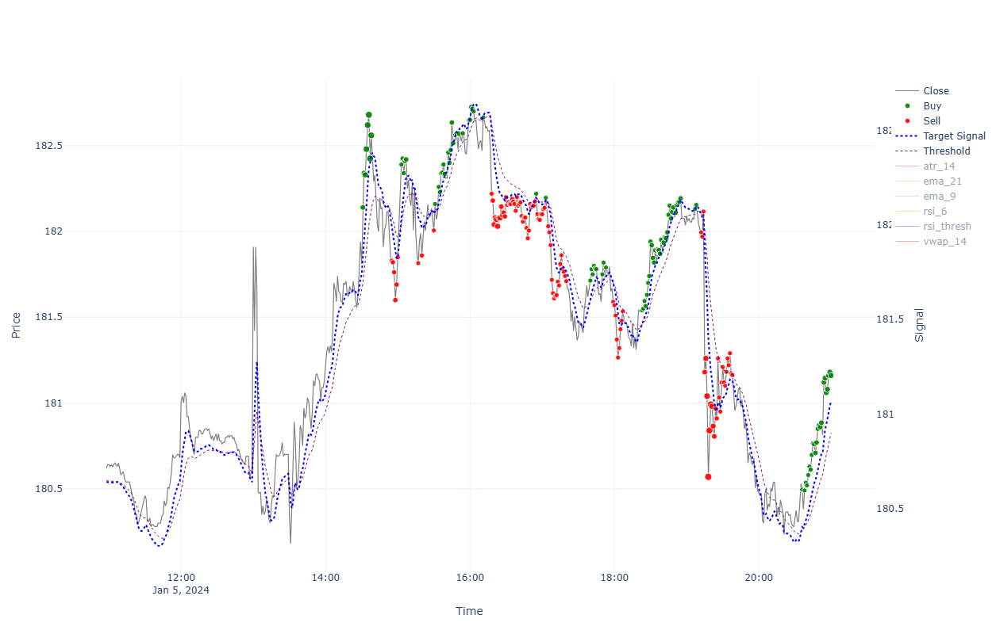


=== Performance for 2024-01-05 00:00:00 ===

INTRADAY:
  shares(619); [buy@181.846, fee=0.004, pos_amnt_buy 112565.126]; [sell@181.124, fee=0.018, pos_amnt_sell 112104.373]; PNL=-460.753
TRADES:
  Tr[1]: Time(14:31)Ask(182.176)Bid(182.103)Act(Buy)Shrs(4)Pos(10); CashTr(-728.721)=Cost(-728.705)-Fee(-0.016); P&L(114600.025)=CashTot(112778.991)+PosAmt(1821.035)
  Tr[2]: Time(14:32)Ask(182.376)Bid(182.304)Act(Buy)Shrs(5)Pos(15); CashTr(-911.902)=Cost(-911.882)-Fee(-0.02); P&L(114601.641)=CashTot(111867.088)+PosAmt(2734.553)
  Tr[3]: Time(14:33)Ask(182.366)Bid(182.294)Act(Buy)Shrs(6)Pos(21); CashTr(-1094.223)=Cost(-1094.199)-Fee(-0.024); P&L(114601.03)=CashTot(110772.865)+PosAmt(3828.164)
  Tr[4]: Time(14:34)Ask(182.516)Bid(182.444)Act(Buy)Shrs(7)Pos(28); CashTr(-1277.643)=Cost(-1277.615)-Fee(-0.028); P&L(114603.64)=CashTot(109495.222)+PosAmt(5108.418)
  Tr[5]: Time(14:35)Ask(182.657)Bid(182.583)Act(Buy)Shrs(8)Pos(36); CashTr(-1461.284)=Cost(-1461.252)-Fee(-0.032); P&L(114606.943)=CashTot(

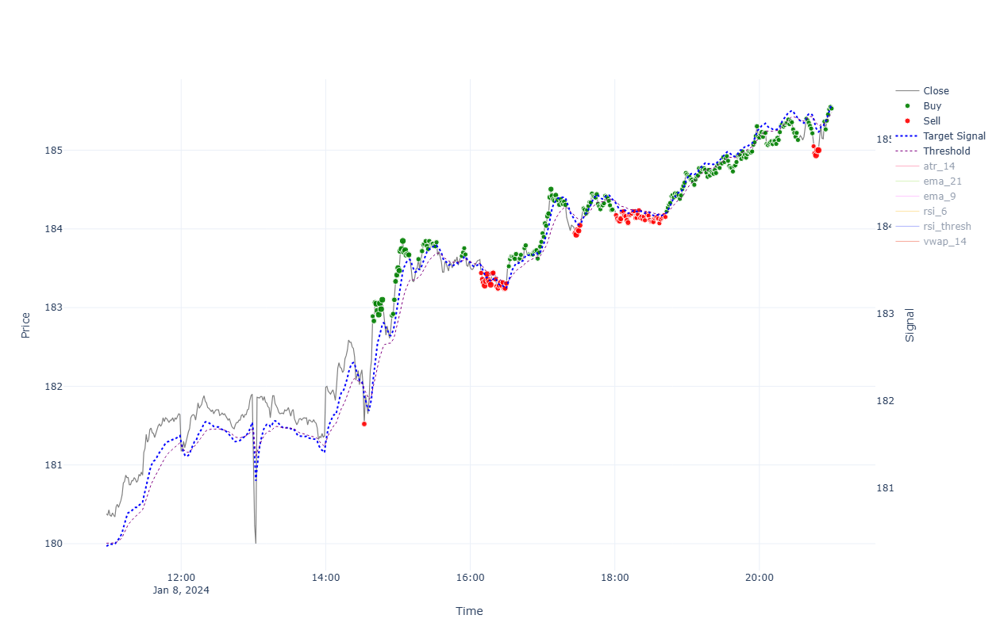


=== Performance for 2024-01-08 00:00:00 ===

INTRADAY:
  shares(615); [buy@182.246, fee=0.004, pos_amnt_buy 112084.022]; [sell@185.493, fee=0.018, pos_amnt_sell 114066.902]; PNL=1982.88
TRADES:
  Tr[1]: Time(14:32)Ask(181.557)Bid(181.484)Act(Sell)Shrs(3)Pos(67); CashTr(544.399)=Cost(544.453)-Fee(-0.054); P&L(114482.894)=CashTot(102323.433)+PosAmt(12159.461)
  Tr[2]: Time(14:39)Ask(182.927)Bid(182.853)Act(Buy)Shrs(1)Pos(68); CashTr(-182.931)=Cost(-182.927)-Fee(-0.004); P&L(114574.535)=CashTot(102140.502)+PosAmt(12434.033)
  Tr[3]: Time(14:40)Ask(182.867)Bid(182.793)Act(Buy)Shrs(3)Pos(71); CashTr(-548.612)=Cost(-548.6)-Fee(-0.012); P&L(114570.224)=CashTot(101591.89)+PosAmt(12978.334)
  Tr[4]: Time(14:41)Ask(183.1)Bid(183.027)Act(Buy)Shrs(5)Pos(76); CashTr(-915.521)=Cost(-915.501)-Fee(-0.02); P&L(114586.42)=CashTot(100676.369)+PosAmt(13910.051)
  Tr[5]: Time(14:42)Ask(183.085)Bid(183.012)Act(Buy)Shrs(7)Pos(83); CashTr(-1281.624)=Cost(-1281.596)-Fee(-0.028); P&L(114584.74)=CashTot(99394.7

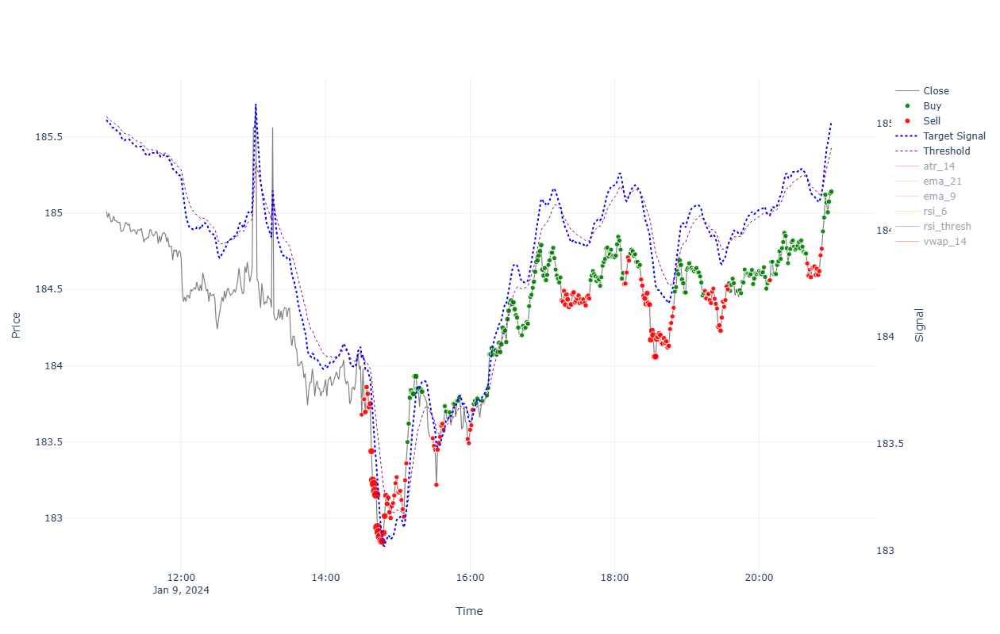


=== Performance for 2024-01-09 00:00:00 ===

INTRADAY:
  shares(620); [buy@183.717, fee=0.004, pos_amnt_buy 113906.856]; [sell@185.103, fee=0.018, pos_amnt_sell 114752.529]; PNL=845.673
TRADES:
  Tr[1]: Time(14:30)Ask(183.717)Bid(183.643)Act(Sell)Shrs(1)Pos(248); CashTr(183.625)=Cost(183.643)-Fee(-0.018); P&L(114444.924)=CashTot(68901.395)+PosAmt(45543.529)
  Tr[2]: Time(14:32)Ask(183.817)Bid(183.743)Act(Sell)Shrs(1)Pos(247); CashTr(183.725)=Cost(183.743)-Fee(-0.018); P&L(114469.701)=CashTot(69085.12)+PosAmt(45384.581)
  Tr[3]: Time(14:33)Ask(183.734)Bid(183.66)Act(Sell)Shrs(4)Pos(243); CashTr(734.569)=Cost(734.641)-Fee(-0.073); P&L(114449.156)=CashTot(69819.688)+PosAmt(44629.468)
  Tr[4]: Time(14:34)Ask(183.897)Bid(183.823)Act(Sell)Shrs(3)Pos(240); CashTr(551.415)=Cost(551.47)-Fee(-0.055); P&L(114488.678)=CashTot(70371.103)+PosAmt(44117.575)
  Tr[5]: Time(14:35)Ask(183.852)Bid(183.779)Act(Sell)Shrs(3)Pos(237); CashTr(551.282)=Cost(551.337)-Fee(-0.055); P&L(114477.969)=CashTot(70922.3

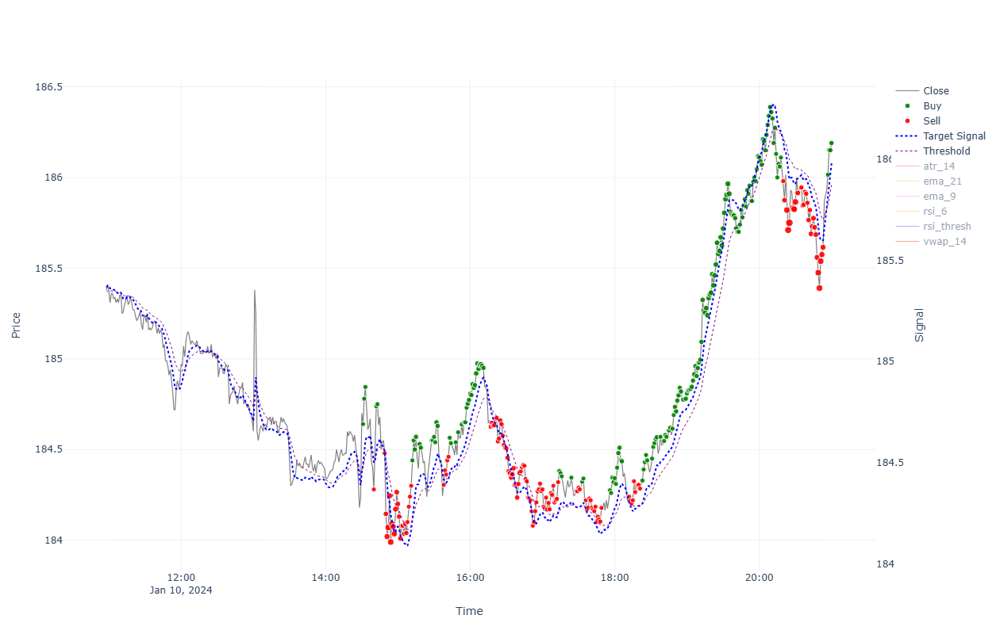


=== Performance for 2024-01-10 00:00:00 ===

INTRADAY:
  shares(621); [buy@184.737, fee=0.004, pos_amnt_buy 114724.124]; [sell@186.153, fee=0.018, pos_amnt_sell 115589.518]; PNL=865.395
TRADES:
  Tr[1]: Time(14:31)Ask(184.677)Bid(184.603)Act(Buy)Shrs(1)Pos(121); CashTr(-184.681)=Cost(-184.677)-Fee(-0.004); P&L(114295.076)=CashTot(91958.105)+PosAmt(22336.972)
  Tr[2]: Time(14:32)Ask(184.817)Bid(184.743)Act(Buy)Shrs(1)Pos(122); CashTr(-184.821)=Cost(-184.817)-Fee(-0.004); P&L(114311.935)=CashTot(91773.284)+PosAmt(22538.651)
  Tr[3]: Time(14:33)Ask(184.882)Bid(184.808)Act(Buy)Shrs(1)Pos(123); CashTr(-184.886)=Cost(-184.882)-Fee(-0.004); P&L(114319.786)=CashTot(91588.398)+PosAmt(22731.388)
  Tr[4]: Time(14:40)Ask(184.317)Bid(184.243)Act(Sell)Shrs(1)Pos(122); CashTr(184.225)=Cost(184.243)-Fee(-0.018); P&L(114250.286)=CashTot(91772.623)+PosAmt(22477.664)
  Tr[5]: Time(14:42)Ask(184.775)Bid(184.701)Act(Buy)Shrs(1)Pos(123); CashTr(-184.779)=Cost(-184.775)-Fee(-0.004); P&L(114306.085)=CashTot(

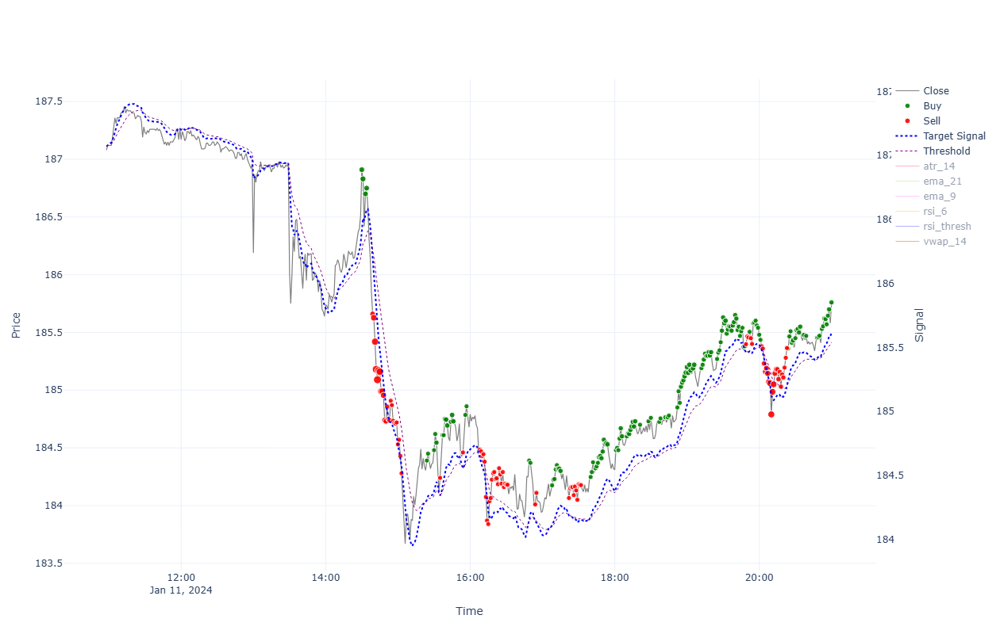


=== Performance for 2024-01-11 00:00:00 ===

INTRADAY:
  shares(618); [buy@186.947, fee=0.004, pos_amnt_buy 115535.954]; [sell@185.723, fee=0.018, pos_amnt_sell 114765.434]; PNL=-770.52
TRADES:
  Tr[1]: Time(14:30)Ask(186.947)Bid(186.873)Act(Buy)Shrs(4)Pos(105); CashTr(-747.806)=Cost(-747.79)-Fee(-0.016); P&L(114359.977)=CashTot(94738.352)+PosAmt(19621.625)
  Tr[2]: Time(14:31)Ask(186.867)Bid(186.793)Act(Buy)Shrs(5)Pos(110); CashTr(-934.357)=Cost(-934.337)-Fee(-0.02); P&L(114351.185)=CashTot(93803.995)+PosAmt(20547.19)
  Tr[3]: Time(14:33)Ask(186.737)Bid(186.663)Act(Buy)Shrs(4)Pos(114); CashTr(-746.965)=Cost(-746.949)-Fee(-0.016); P&L(114336.573)=CashTot(93057.03)+PosAmt(21279.543)
  Tr[4]: Time(14:34)Ask(186.787)Bid(186.713)Act(Buy)Shrs(4)Pos(118); CashTr(-747.165)=Cost(-747.149)-Fee(-0.016); P&L(114341.957)=CashTot(92309.864)+PosAmt(22032.093)
  Tr[5]: Time(14:39)Ask(185.697)Bid(185.623)Act(Sell)Shrs(4)Pos(114); CashTr(742.418)=Cost(742.491)-Fee(-0.073); P&L(114213.29)=CashTot(93052

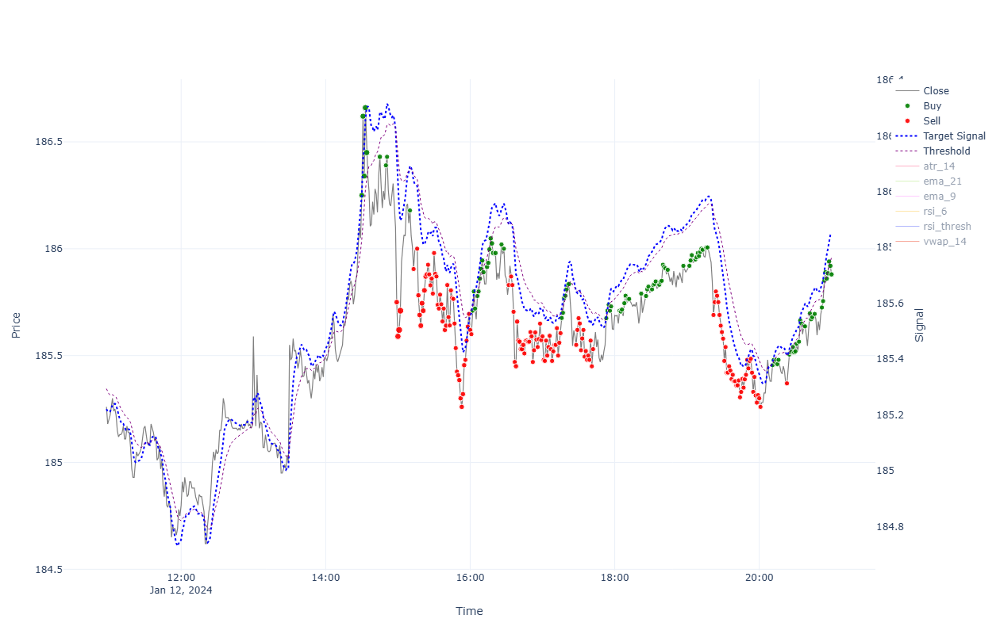


=== Performance for 2024-01-12 00:00:00 ===

INTRADAY:
  shares(616); [buy@186.287, fee=0.004, pos_amnt_buy 114755.472]; [sell@185.843, fee=0.018, pos_amnt_sell 114467.928]; PNL=-287.543
TRADES:
  Tr[1]: Time(14:30)Ask(186.287)Bid(186.213)Act(Buy)Shrs(4)Pos(96); CashTr(-745.165)=Cost(-745.149)-Fee(-0.016); P&L(114208.236)=CashTot(96331.803)+PosAmt(17876.434)
  Tr[2]: Time(14:31)Ask(186.657)Bid(186.583)Act(Buy)Shrs(5)Pos(101); CashTr(-933.307)=Cost(-933.287)-Fee(-0.02); P&L(114243.346)=CashTot(95398.496)+PosAmt(18844.85)
  Tr[3]: Time(14:32)Ask(186.377)Bid(186.303)Act(Buy)Shrs(5)Pos(106); CashTr(-931.906)=Cost(-931.886)-Fee(-0.02); P&L(114214.679)=CashTot(94466.59)+PosAmt(19748.09)
  Tr[4]: Time(14:33)Ask(186.697)Bid(186.623)Act(Buy)Shrs(6)Pos(112); CashTr(-1120.208)=Cost(-1120.184)-Fee(-0.024); P&L(114248.12)=CashTot(93346.382)+PosAmt(20901.739)
  Tr[5]: Time(14:34)Ask(186.487)Bid(186.413)Act(Buy)Shrs(6)Pos(118); CashTr(-1118.948)=Cost(-1118.924)-Fee(-0.024); P&L(114224.134)=CashTot(9

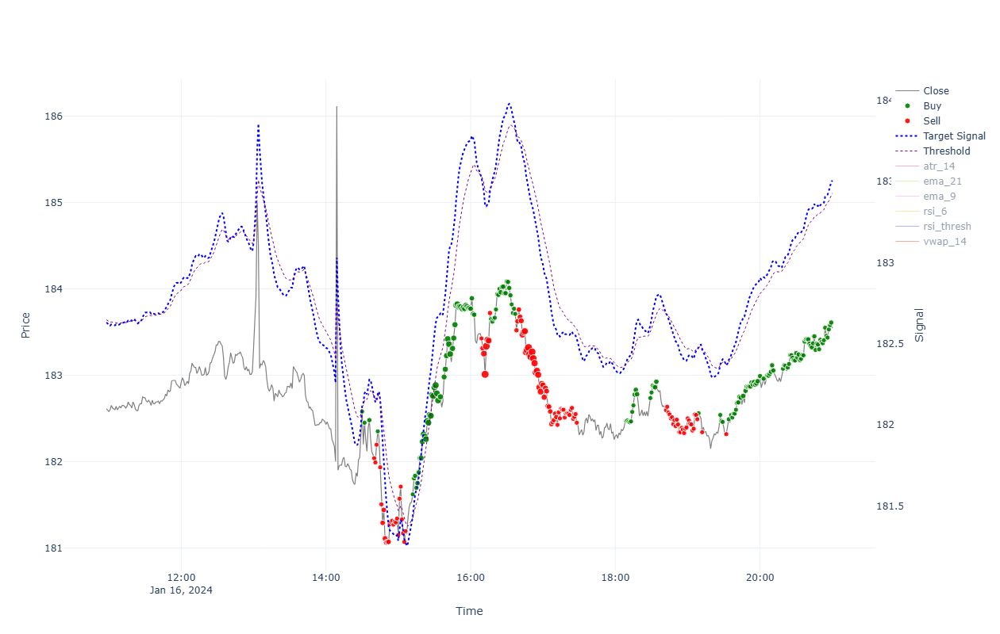


=== Performance for 2024-01-16 00:00:00 ===

INTRADAY:
  shares(626); [buy@182.617, fee=0.004, pos_amnt_buy 114320.443]; [sell@183.508, fee=0.018, pos_amnt_sell 114864.79]; PNL=544.347
TRADES:
  Tr[1]: Time(14:30)Ask(182.617)Bid(182.543)Act(Buy)Shrs(1)Pos(37); CashTr(-182.621)=Cost(-182.617)-Fee(-0.004); P&L(113971.88)=CashTot(107217.771)+PosAmt(6754.109)
  Tr[2]: Time(14:32)Ask(182.486)Bid(182.414)Act(Buy)Shrs(1)Pos(38); CashTr(-182.49)=Cost(-182.486)-Fee(-0.004); P&L(113966.994)=CashTot(107035.281)+PosAmt(6931.713)
  Tr[3]: Time(14:36)Ask(182.516)Bid(182.444)Act(Buy)Shrs(2)Pos(40); CashTr(-365.041)=Cost(-365.033)-Fee(-0.008); P&L(113967.98)=CashTot(106670.24)+PosAmt(7297.74)
  Tr[4]: Time(14:40)Ask(182.075)Bid(182.002)Act(Sell)Shrs(1)Pos(39); CashTr(181.984)=Cost(182.002)-Fee(-0.018); P&L(113950.301)=CashTot(106852.224)+PosAmt(7098.078)
  Tr[5]: Time(14:41)Ask(182.026)Bid(181.954)Act(Sell)Shrs(1)Pos(38); CashTr(181.935)=Cost(181.954)-Fee(-0.018); P&L(113948.396)=CashTot(107034.159)+

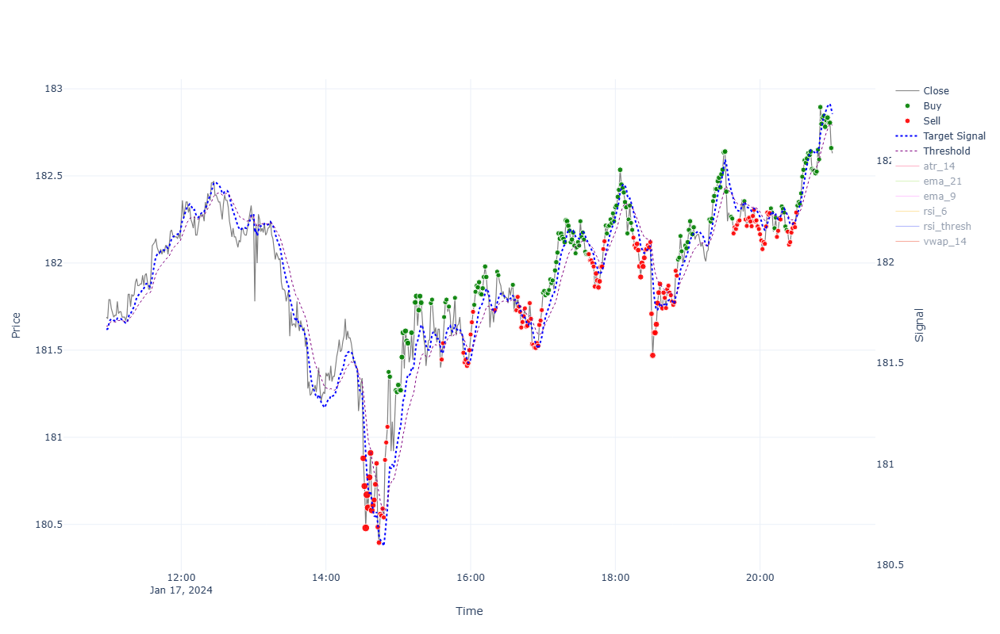


=== Performance for 2024-01-17 00:00:00 ===

INTRADAY:
  shares(633); [buy@181.376, fee=0.004, pos_amnt_buy 114813.71]; [sell@182.593, fee=0.018, pos_amnt_sell 115570.155]; PNL=756.445
TRADES:
  Tr[1]: Time(14:31)Ask(180.915)Bid(180.843)Act(Sell)Shrs(7)Pos(118); CashTr(1265.774)=Cost(1265.901)-Fee(-0.127); P&L(113593.308)=CashTot(92253.831)+PosAmt(21339.477)
  Tr[2]: Time(14:32)Ask(180.756)Bid(180.684)Act(Sell)Shrs(9)Pos(109); CashTr(1625.991)=Cost(1626.155)-Fee(-0.163); P&L(113574.363)=CashTot(93879.823)+PosAmt(19694.54)
  Tr[3]: Time(14:33)Ask(180.516)Bid(180.444)Act(Sell)Shrs(12)Pos(97); CashTr(2165.108)=Cost(2165.326)-Fee(-0.218); P&L(113547.98)=CashTot(96044.931)+PosAmt(17503.049)
  Tr[4]: Time(14:34)Ask(180.706)Bid(180.634)Act(Sell)Shrs(12)Pos(85); CashTr(2167.389)=Cost(2167.606)-Fee(-0.218); P&L(113566.198)=CashTot(98212.319)+PosAmt(15353.879)
  Tr[5]: Time(14:35)Ask(180.632)Bid(180.56)Act(Sell)Shrs(11)Pos(74); CashTr(1985.956)=Cost(1986.155)-Fee(-0.2); P&L(113559.684)=CashTot(

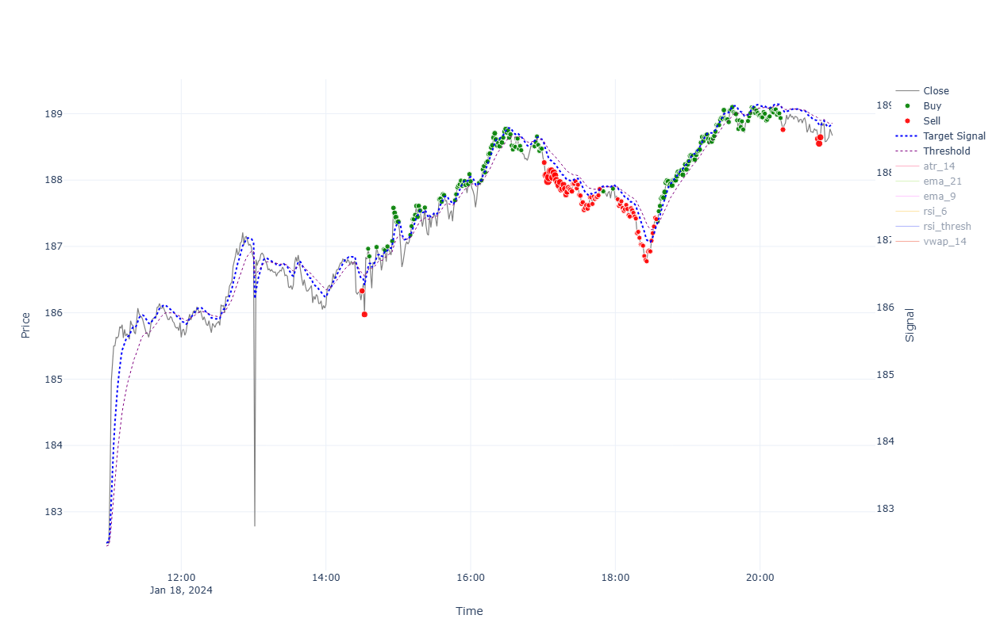


=== Performance for 2024-01-18 00:00:00 ===

INTRADAY:
  shares(620); [buy@186.367, fee=0.004, pos_amnt_buy 115550.123]; [sell@188.632, fee=0.018, pos_amnt_sell 116940.641]; PNL=1390.518
TRADES:
  Tr[1]: Time(14:30)Ask(186.367)Bid(186.293)Act(Sell)Shrs(6)Pos(119); CashTr(1117.646)=Cost(1117.756)-Fee(-0.11); P&L(114026.518)=CashTot(91857.695)+PosAmt(22168.823)
  Tr[2]: Time(14:32)Ask(186.012)Bid(185.938)Act(Sell)Shrs(7)Pos(112); CashTr(1301.437)=Cost(1301.565)-Fee(-0.128); P&L(113984.166)=CashTot(93159.131)+PosAmt(20825.034)
  Tr[3]: Time(14:35)Ask(187.002)Bid(186.928)Act(Buy)Shrs(1)Pos(113); CashTr(-187.006)=Cost(-187.002)-Fee(-0.004); P&L(114094.945)=CashTot(92972.125)+PosAmt(21122.82)
  Tr[4]: Time(14:36)Ask(186.887)Bid(186.813)Act(Buy)Shrs(1)Pos(114); CashTr(-186.891)=Cost(-186.887)-Fee(-0.004); P&L(114081.873)=CashTot(92785.234)+PosAmt(21296.64)
  Tr[5]: Time(14:42)Ask(187.027)Bid(186.953)Act(Buy)Shrs(2)Pos(116); CashTr(-374.063)=Cost(-374.055)-Fee(-0.008); P&L(114097.673)=CashTot

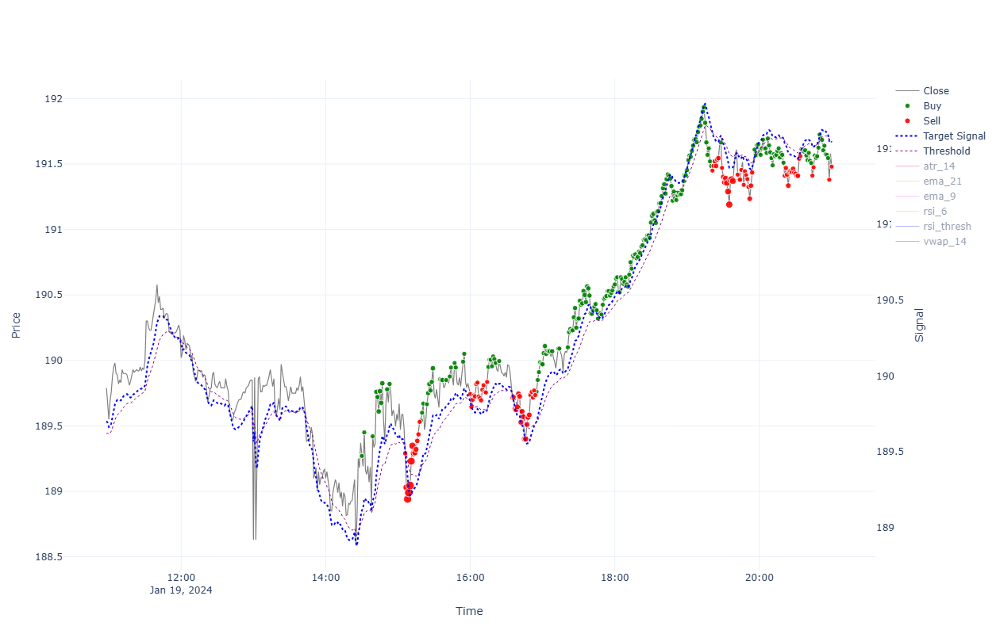


=== Performance for 2024-01-19 00:00:00 ===

INTRADAY:
  shares(617); [buy@189.308, fee=0.004, pos_amnt_buy 116805.414]; [sell@191.442, fee=0.018, pos_amnt_sell 118108.183]; PNL=1302.769
TRADES:
  Tr[1]: Time(14:30)Ask(189.308)Bid(189.232)Act(Buy)Shrs(1)Pos(223); CashTr(-189.312)=Cost(-189.308)-Fee(-0.004); P&L(114333.084)=CashTot(72134.316)+PosAmt(42198.769)
  Tr[2]: Time(14:32)Ask(189.488)Bid(189.412)Act(Buy)Shrs(1)Pos(224); CashTr(-189.492)=Cost(-189.488)-Fee(-0.004); P&L(114373.137)=CashTot(71944.824)+PosAmt(42428.313)
  Tr[3]: Time(14:39)Ask(189.458)Bid(189.382)Act(Buy)Shrs(1)Pos(225); CashTr(-189.462)=Cost(-189.458)-Fee(-0.004); P&L(114366.338)=CashTot(71755.362)+PosAmt(42610.976)
  Tr[4]: Time(14:42)Ask(189.798)Bid(189.722)Act(Buy)Shrs(2)Pos(227); CashTr(-379.604)=Cost(-379.596)-Fee(-0.008); P&L(114442.663)=CashTot(71375.758)+PosAmt(43066.905)
  Tr[5]: Time(14:43)Ask(189.758)Bid(189.682)Act(Buy)Shrs(2)Pos(229); CashTr(-379.524)=Cost(-379.516)-Fee(-0.008); P&L(114433.425)=CashTo

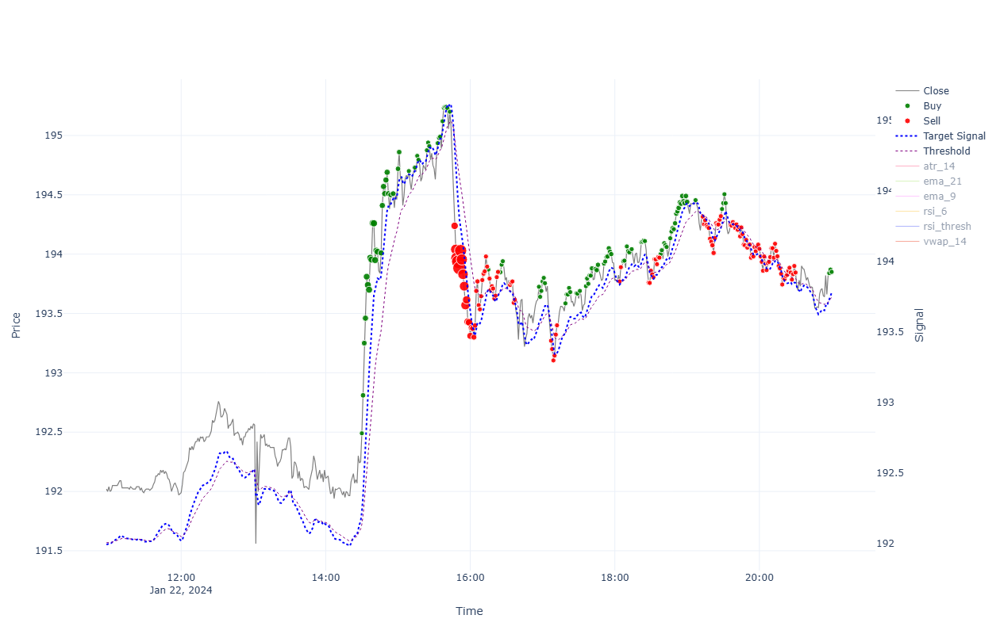


=== Performance for 2024-01-22 00:00:00 ===

INTRADAY:
  shares(613); [buy@192.528, fee=0.004, pos_amnt_buy 118022.421]; [sell@193.811, fee=0.018, pos_amnt_sell 118794.976]; PNL=772.555
TRADES:
  Tr[1]: Time(14:30)Ask(192.528)Bid(192.452)Act(Buy)Shrs(1)Pos(177); CashTr(-192.532)=Cost(-192.528)-Fee(-0.004); P&L(114747.439)=CashTot(80683.523)+PosAmt(34063.916)
  Tr[2]: Time(14:31)Ask(192.849)Bid(192.771)Act(Buy)Shrs(3)Pos(180); CashTr(-578.558)=Cost(-578.546)-Fee(-0.012); P&L(114803.824)=CashTot(80104.965)+PosAmt(34698.859)
  Tr[3]: Time(14:32)Ask(193.289)Bid(193.211)Act(Buy)Shrs(4)Pos(184); CashTr(-773.171)=Cost(-773.155)-Fee(-0.016); P&L(114882.683)=CashTot(79331.795)+PosAmt(35550.888)
  Tr[4]: Time(14:33)Ask(193.499)Bid(193.421)Act(Buy)Shrs(6)Pos(190); CashTr(-1161.016)=Cost(-1160.992)-Fee(-0.024); P&L(114920.827)=CashTot(78170.779)+PosAmt(36750.049)
  Tr[5]: Time(14:34)Ask(193.849)Bid(193.771)Act(Buy)Shrs(8)Pos(198); CashTr(-1550.822)=Cost(-1550.79)-Fee(-0.032); P&L(114986.662)=Cash

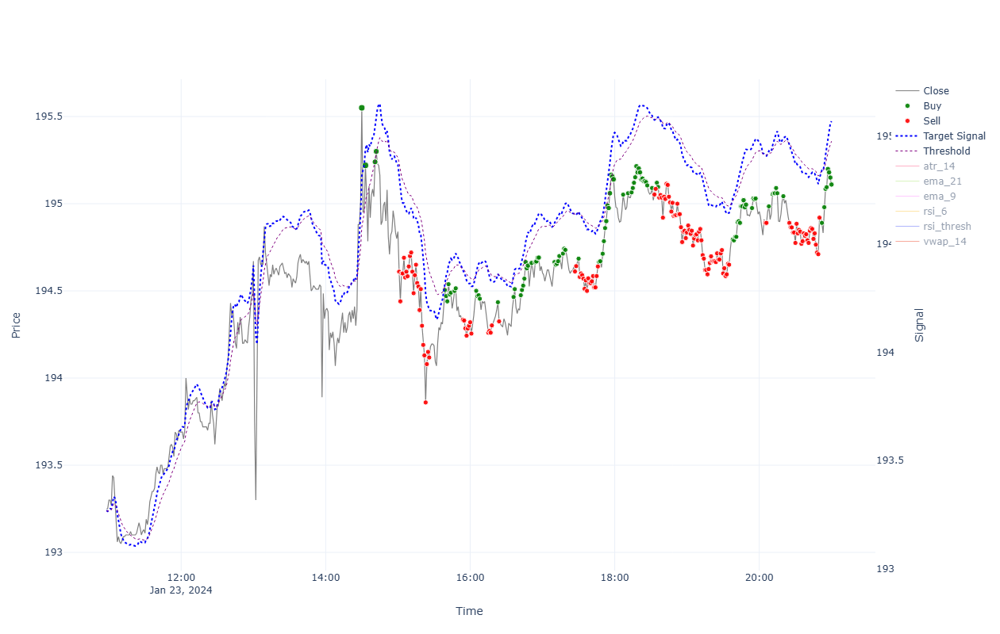


=== Performance for 2024-01-23 00:00:00 ===

INTRADAY:
  shares(607); [buy@195.589, fee=0.004, pos_amnt_buy 118725.018]; [sell@195.071, fee=0.018, pos_amnt_sell 118396.869]; PNL=-328.149
TRADES:
  Tr[1]: Time(14:30)Ask(195.589)Bid(195.511)Act(Buy)Shrs(7)Pos(10); CashTr(-1369.152)=Cost(-1369.124)-Fee(-0.028); P&L(114876.189)=CashTot(112921.08)+PosAmt(1955.109)
  Tr[2]: Time(14:33)Ask(195.259)Bid(195.181)Act(Buy)Shrs(7)Pos(17); CashTr(-1366.841)=Cost(-1366.813)-Fee(-0.028); P&L(114872.315)=CashTot(111554.239)+PosAmt(3318.076)
  Tr[3]: Time(14:41)Ask(195.279)Bid(195.201)Act(Buy)Shrs(4)Pos(21); CashTr(-781.132)=Cost(-781.116)-Fee(-0.016); P&L(114872.326)=CashTot(110773.106)+PosAmt(4099.22)
  Tr[4]: Time(14:42)Ask(195.339)Bid(195.261)Act(Buy)Shrs(5)Pos(26); CashTr(-976.715)=Cost(-976.695)-Fee(-0.02); P&L(114873.175)=CashTot(109796.391)+PosAmt(5076.784)
  Tr[5]: Time(15:01)Ask(194.649)Bid(194.571)Act(Sell)Shrs(1)Pos(25); CashTr(194.553)=Cost(194.571)-Fee(-0.018); P&L(114855.221)=CashTot(109

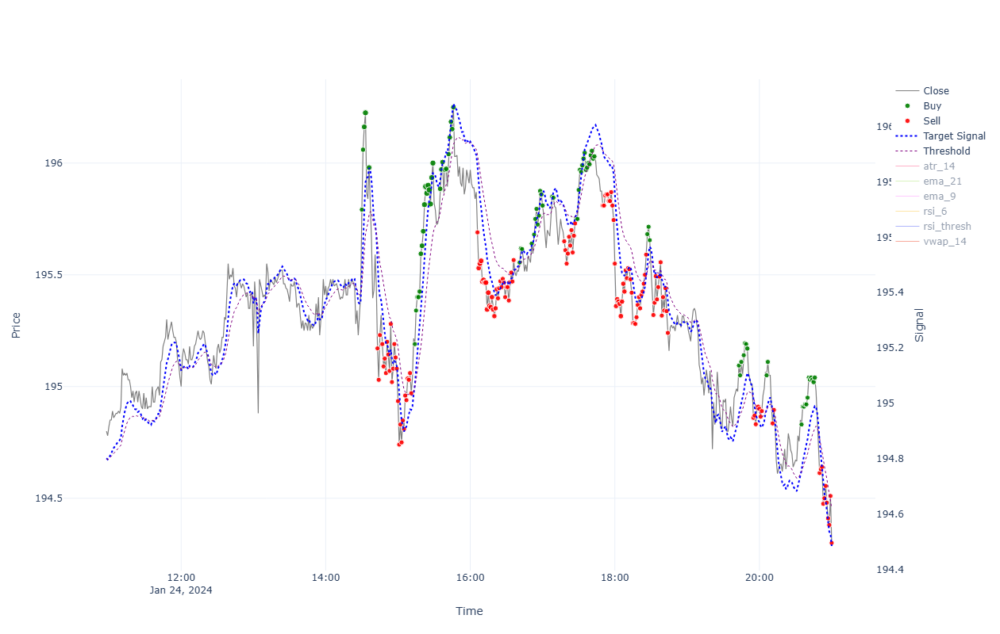


=== Performance for 2024-01-24 00:00:00 ===

INTRADAY:
  shares(604); [buy@195.831, fee=0.004, pos_amnt_buy 118284.254]; [sell@194.261, fee=0.018, pos_amnt_sell 117322.58]; PNL=-961.674
TRADES:
  Tr[1]: Time(14:30)Ask(195.831)Bid(195.753)Act(Buy)Shrs(1)Pos(13); CashTr(-195.835)=Cost(-195.831)-Fee(-0.004); P&L(114827.77)=CashTot(112282.987)+PosAmt(2544.783)
  Tr[2]: Time(14:31)Ask(196.099)Bid(196.021)Act(Buy)Shrs(2)Pos(15); CashTr(-392.206)=Cost(-392.198)-Fee(-0.008); P&L(114831.093)=CashTot(111890.781)+PosAmt(2940.312)
  Tr[3]: Time(14:32)Ask(196.201)Bid(196.123)Act(Buy)Shrs(4)Pos(19); CashTr(-784.821)=Cost(-784.805)-Fee(-0.016); P&L(114832.292)=CashTot(111105.96)+PosAmt(3726.333)
  Tr[4]: Time(14:33)Ask(196.264)Bid(196.186)Act(Buy)Shrs(5)Pos(24); CashTr(-981.341)=Cost(-981.321)-Fee(-0.02); P&L(114833.077)=CashTot(110124.619)+PosAmt(4708.458)
  Tr[5]: Time(14:36)Ask(196.019)Bid(195.941)Act(Buy)Shrs(4)Pos(28); CashTr(-784.092)=Cost(-784.076)-Fee(-0.016); P&L(114826.866)=CashTot(109340.

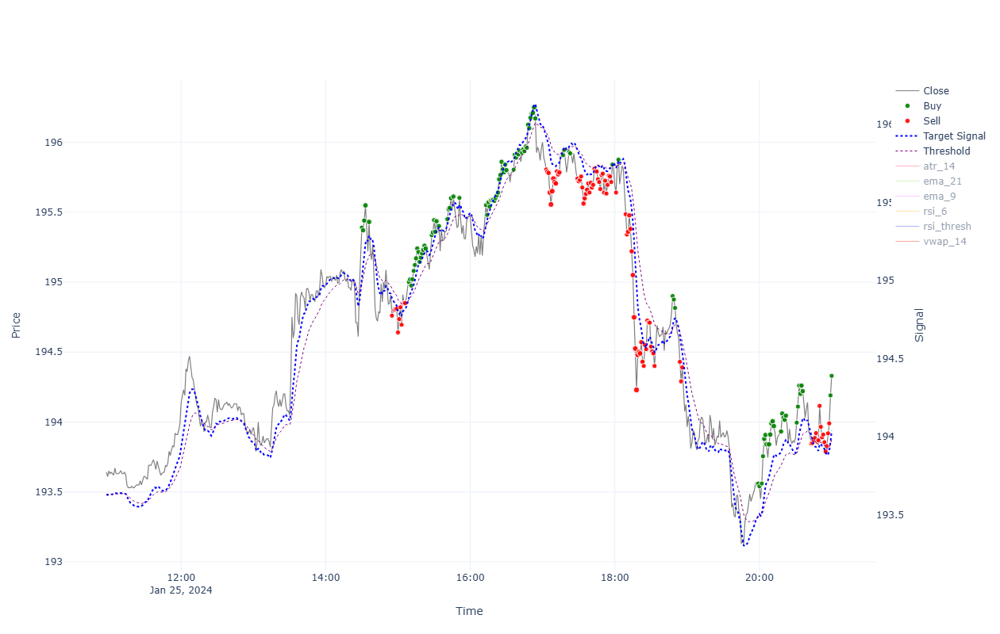


=== Performance for 2024-01-25 00:00:00 ===

INTRADAY:
  shares(600); [buy@195.429, fee=0.004, pos_amnt_buy 117259.847]; [sell@194.291, fee=0.018, pos_amnt_sell 116563.605]; PNL=-696.241
TRADES:
  Tr[1]: Time(14:30)Ask(195.429)Bid(195.351)Act(Buy)Shrs(1)Pos(7); CashTr(-195.433)=Cost(-195.429)-Fee(-0.004); P&L(114722.044)=CashTot(113354.587)+PosAmt(1367.456)
  Tr[2]: Time(14:31)Ask(195.409)Bid(195.331)Act(Buy)Shrs(2)Pos(9); CashTr(-390.826)=Cost(-390.818)-Fee(-0.008); P&L(114721.74)=CashTot(112963.761)+PosAmt(1757.978)
  Tr[3]: Time(14:32)Ask(195.479)Bid(195.401)Act(Buy)Shrs(2)Pos(11); CashTr(-390.966)=Cost(-390.958)-Fee(-0.008); P&L(114722.205)=CashTot(112572.795)+PosAmt(2149.41)
  Tr[4]: Time(14:33)Ask(195.588)Bid(195.509)Act(Buy)Shrs(3)Pos(14); CashTr(-586.775)=Cost(-586.763)-Fee(-0.012); P&L(114723.151)=CashTot(111986.021)+PosAmt(2737.13)
  Tr[5]: Time(14:36)Ask(195.469)Bid(195.391)Act(Buy)Shrs(3)Pos(17); CashTr(-586.419)=Cost(-586.407)-Fee(-0.012); P&L(114721.247)=CashTot(111399.6

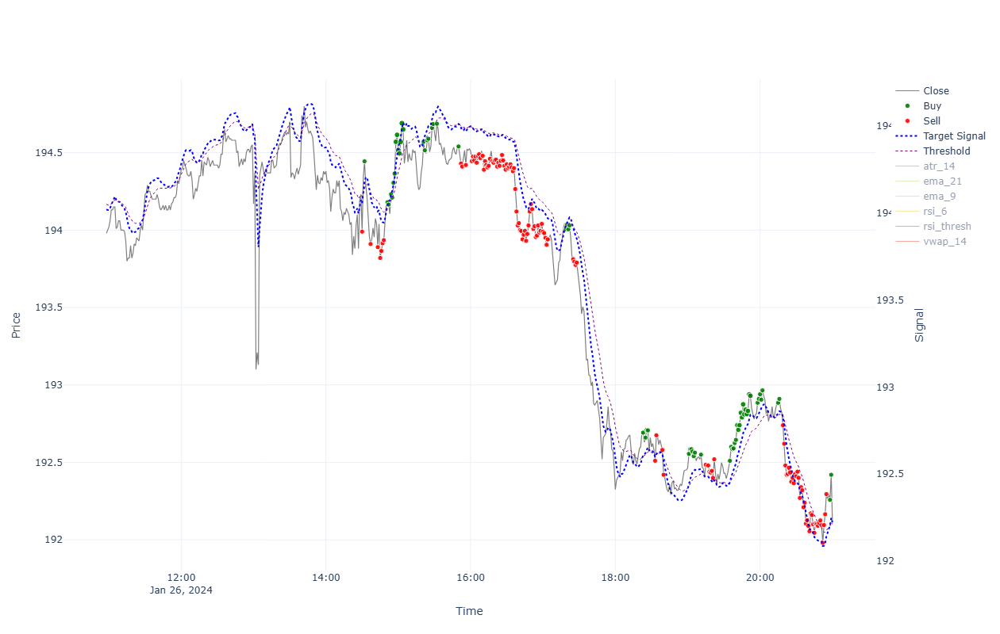


=== Performance for 2024-01-26 00:00:00 ===

INTRADAY:
  shares(600); [buy@194.029, fee=0.004, pos_amnt_buy 116419.679]; [sell@192.082, fee=0.018, pos_amnt_sell 115237.901]; PNL=-1181.778
TRADES:
  Tr[1]: Time(14:30)Ask(194.029)Bid(193.951)Act(Sell)Shrs(1)Pos(30); CashTr(193.933)=Cost(193.951)-Fee(-0.018); P&L(114654.47)=CashTot(108835.934)+PosAmt(5818.536)
  Tr[2]: Time(14:32)Ask(194.483)Bid(194.405)Act(Buy)Shrs(1)Pos(31); CashTr(-194.487)=Cost(-194.483)-Fee(-0.004); P&L(114668.005)=CashTot(108641.447)+PosAmt(6026.558)
  Tr[3]: Time(14:37)Ask(193.949)Bid(193.871)Act(Sell)Shrs(1)Pos(30); CashTr(193.853)=Cost(193.871)-Fee(-0.018); P&L(114651.436)=CashTot(108835.3)+PosAmt(5816.137)
  Tr[4]: Time(14:43)Ask(193.929)Bid(193.851)Act(Sell)Shrs(1)Pos(29); CashTr(193.833)=Cost(193.851)-Fee(-0.018); P&L(114650.818)=CashTot(109029.132)+PosAmt(5621.685)
  Tr[5]: Time(14:45)Ask(193.859)Bid(193.781)Act(Sell)Shrs(1)Pos(28); CashTr(193.763)=Cost(193.781)-Fee(-0.018); P&L(114648.77)=CashTot(109222.895

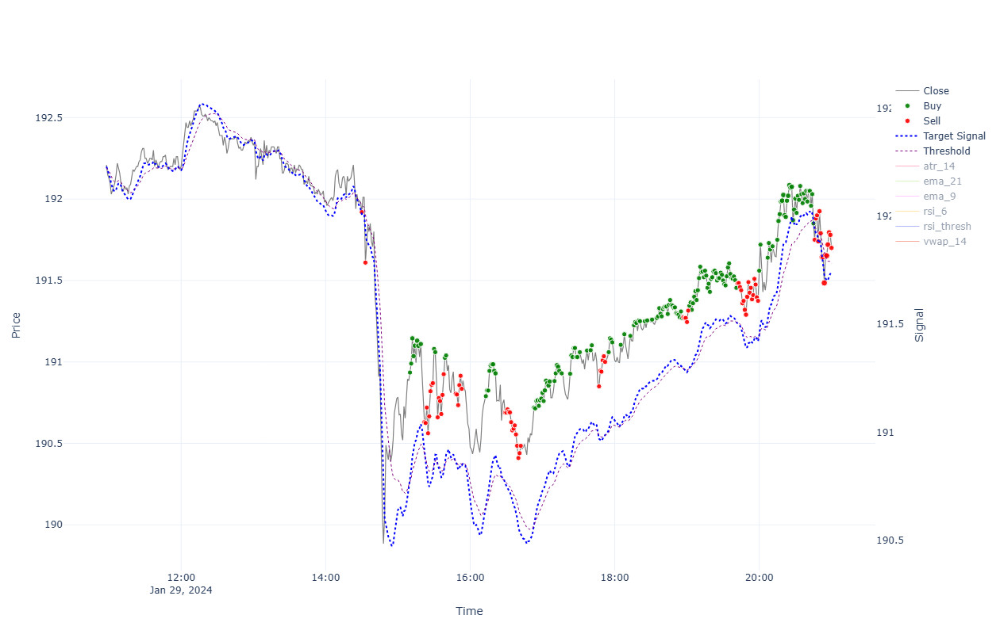


=== Performance for 2024-01-29 00:00:00 ===

INTRADAY:
  shares(600); [buy@191.958, fee=0.004, pos_amnt_buy 115177.43]; [sell@191.662, fee=0.018, pos_amnt_sell 114985.957]; PNL=-191.473
TRADES:
  Tr[1]: Time(14:30)Ask(191.958)Bid(191.882)Act(Sell)Shrs(1)Pos(1); CashTr(191.863)=Cost(191.882)-Fee(-0.018); P&L(114614.161)=CashTot(114422.28)+PosAmt(191.882)
  Tr[2]: Time(14:33)Ask(191.648)Bid(191.572)Act(Sell)Shrs(1)Pos(0); CashTr(191.553)=Cost(191.572)-Fee(-0.018); P&L(114613.833)=CashTot(114613.833)+PosAmt(0.0)
  Tr[3]: Time(15:10)Ask(190.973)Bid(190.897)Act(Buy)Shrs(1)Pos(1); CashTr(-190.977)=Cost(-190.973)-Fee(-0.004); P&L(114613.753)=CashTot(114422.856)+PosAmt(190.897)
  Tr[4]: Time(15:11)Ask(191.028)Bid(190.952)Act(Buy)Shrs(1)Pos(2); CashTr(-191.032)=Cost(-191.028)-Fee(-0.004); P&L(114613.727)=CashTot(114231.824)+PosAmt(381.904)
  Tr[5]: Time(15:12)Ask(191.183)Bid(191.107)Act(Buy)Shrs(2)Pos(4); CashTr(-382.374)=Cost(-382.366)-Fee(-0.008); P&L(114613.876)=CashTot(113849.449)+PosAmt(7

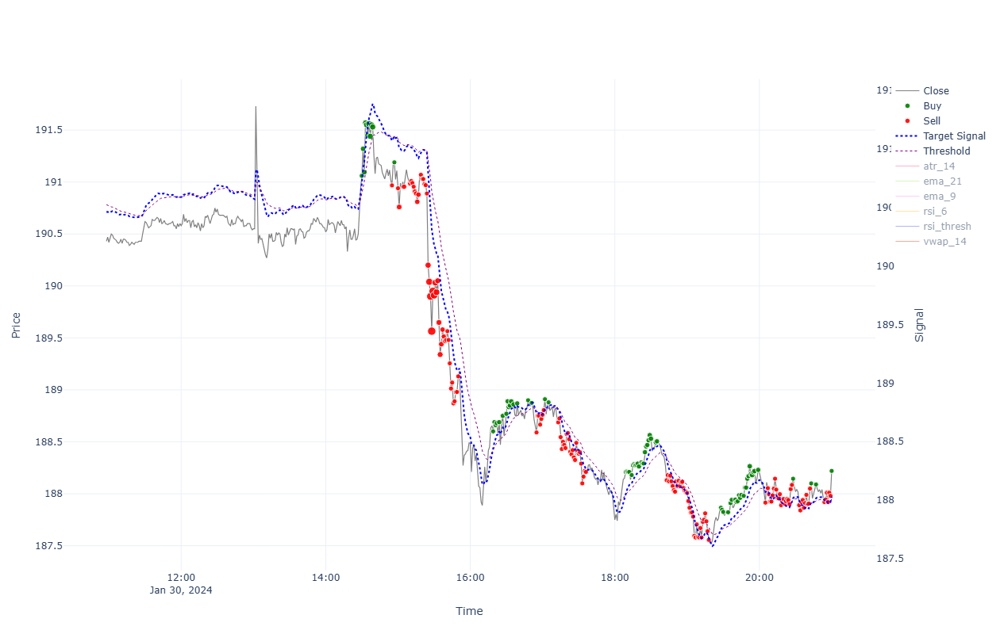


=== Performance for 2024-01-30 00:00:00 ===

INTRADAY:
  shares(601); [buy@191.098, fee=0.004, pos_amnt_buy 114852.429]; [sell@188.182, fee=0.018, pos_amnt_sell 113086.587]; PNL=-1765.843
TRADES:
  Tr[1]: Time(14:30)Ask(191.098)Bid(191.022)Act(Buy)Shrs(2)Pos(99); CashTr(-382.204)=Cost(-382.196)-Fee(-0.008); P&L(114548.572)=CashTot(95637.415)+PosAmt(18911.157)
  Tr[2]: Time(14:31)Ask(191.358)Bid(191.282)Act(Buy)Shrs(3)Pos(102); CashTr(-574.087)=Cost(-574.075)-Fee(-0.012); P&L(114574.066)=CashTot(95063.329)+PosAmt(19510.737)
  Tr[3]: Time(14:32)Ask(191.133)Bid(191.057)Act(Buy)Shrs(4)Pos(106); CashTr(-764.549)=Cost(-764.533)-Fee(-0.016); P&L(114550.799)=CashTot(94298.78)+PosAmt(20252.019)
  Tr[4]: Time(14:33)Ask(191.608)Bid(191.532)Act(Buy)Shrs(5)Pos(111); CashTr(-958.062)=Cost(-958.042)-Fee(-0.02); P&L(114600.735)=CashTot(93340.718)+PosAmt(21260.017)
  Tr[5]: Time(14:34)Ask(191.589)Bid(191.513)Act(Buy)Shrs(6)Pos(117); CashTr(-1149.56)=Cost(-1149.536)-Fee(-0.024); P&L(114598.143)=CashTot

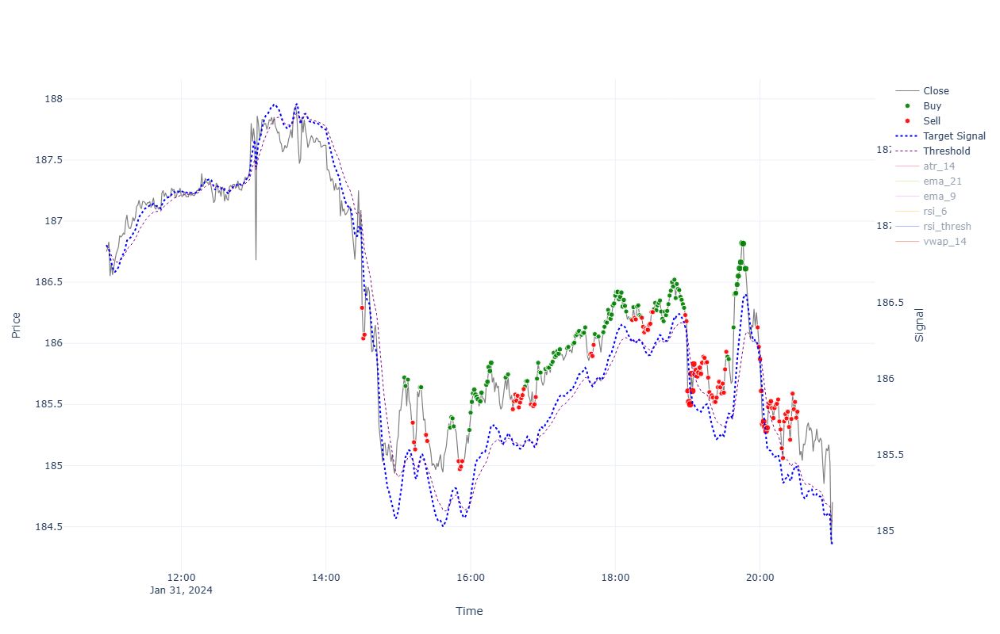


=== Performance for 2024-01-31 00:00:00 ===

INTRADAY:
  shares(606); [buy@186.327, fee=0.004, pos_amnt_buy 112916.742]; [sell@184.663, fee=0.018, pos_amnt_sell 111894.762]; PNL=-1021.98
TRADES:
  Tr[1]: Time(14:30)Ask(186.327)Bid(186.253)Act(Sell)Shrs(1)Pos(2); CashTr(186.234)=Cost(186.253)-Fee(-0.018); P&L(114313.727)=CashTot(113941.222)+PosAmt(372.505)
  Tr[2]: Time(14:31)Ask(186.077)Bid(186.003)Act(Sell)Shrs(1)Pos(1); CashTr(185.985)=Cost(186.003)-Fee(-0.018); P&L(114313.209)=CashTot(114127.206)+PosAmt(186.003)
  Tr[3]: Time(14:32)Ask(186.107)Bid(186.033)Act(Sell)Shrs(1)Pos(0); CashTr(186.015)=Cost(186.033)-Fee(-0.018); P&L(114313.221)=CashTot(114313.221)+PosAmt(0.0)
  Tr[4]: Time(15:05)Ask(185.757)Bid(185.683)Act(Buy)Shrs(1)Pos(1); CashTr(-185.761)=Cost(-185.757)-Fee(-0.004); P&L(114313.143)=CashTot(114127.46)+PosAmt(185.683)
  Tr[5]: Time(15:06)Ask(185.687)Bid(185.613)Act(Buy)Shrs(1)Pos(2); CashTr(-185.691)=Cost(-185.687)-Fee(-0.004); P&L(114312.994)=CashTot(113941.769)+PosAmt(3

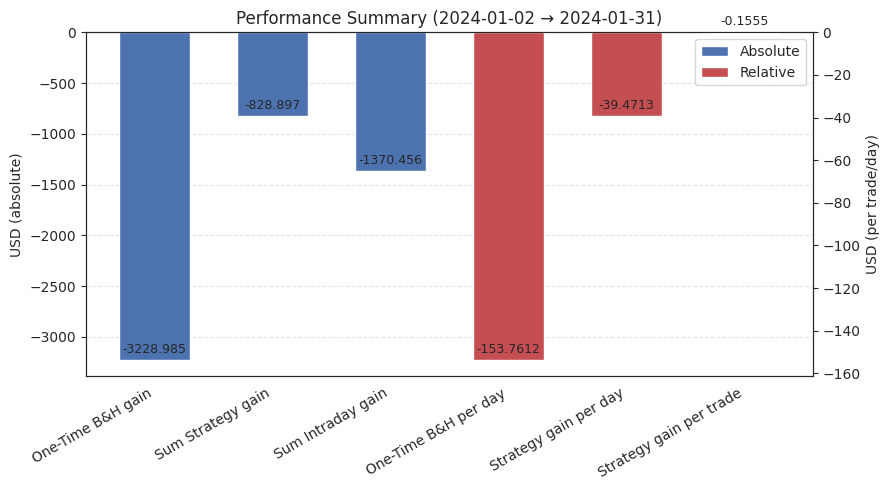


Overall Summary (2024-01-02 = 189.978 → 2024-01-31 = 184.663)
Num. trading days: 21
Trades Count: 5331
Initial capital: 115000.000

One-Time B&H gain: -3228.985 | final: 111771.015 | PnL%: -2.81%
Sum Strategy gain: -828.897 | final: 114171.103 | PnL%: -0.72%
Sum Intraday gain: -1370.456 | final: 113629.544 | PnL%: -1.19%

One-Time B&H gain per day: -153.7612
Strategy gain per day: -39.4713
Strategy gain per trade: -0.1555


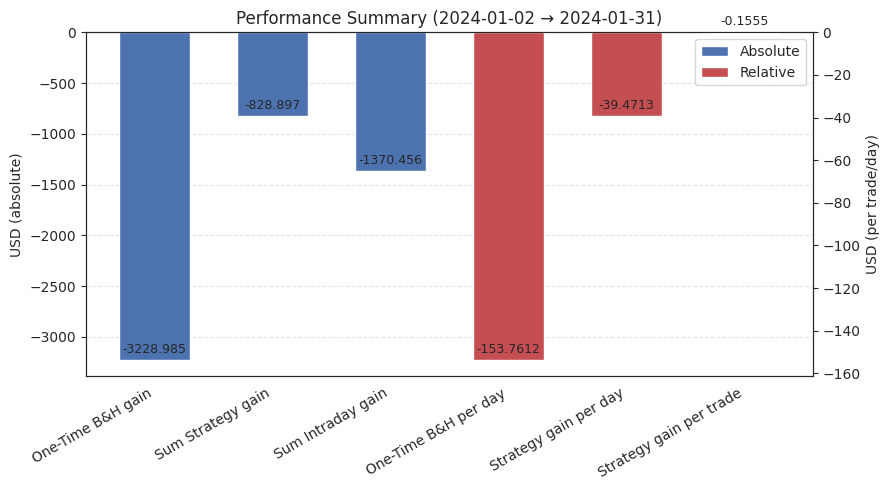

In [25]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = "ema_9",
            sign_thresh        = "ema_21", 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14'], 
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(days_in_month)], shares = n_shares, df= df_month)
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(sim_results)], shares = n_shares, df = df_inds_test)
